###  MicroGrad demo

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

import plotly.graph_objects as go

In [2]:
from micrograd.engine import Value
from micrograd.nn import Neuron, Layer, MLP

In [3]:
np.random.seed(1337)
random.seed(1337)

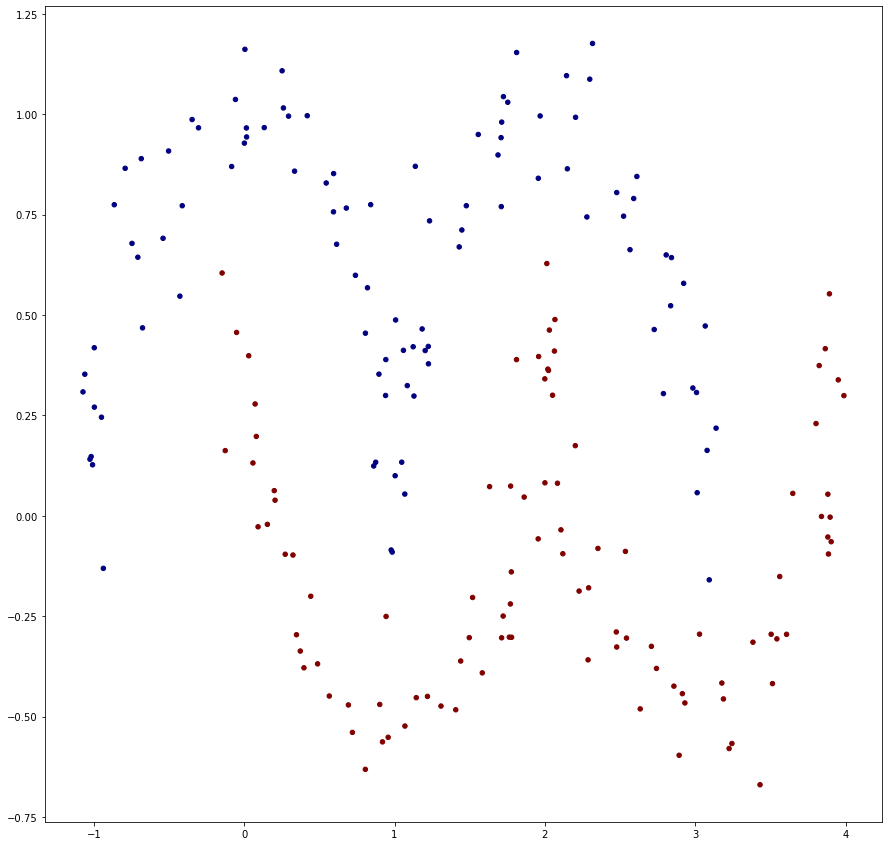

In [24]:
# make up a dataset

from sklearn.datasets import make_moons, make_blobs
X, y = make_moons(n_samples=100, noise=0.1)
Xd, yd = make_moons(n_samples=100, noise=0.1)

Xd += [2,0]

X = np.concatenate([X,Xd])
y = np.concatenate([y,yd])

y = y*2 - 1 # make y be -1 or 1
# visualize in 2D
plt.figure(figsize=(15,15))
plt.scatter(X[:,0], X[:,1], c=y, s=20, cmap='jet')

array([[ 2.91326876e+00,  3.01976635e-01],
       [ 1.00534961e-01,  1.12203459e+00],
       [ 9.22348413e-02,  4.83432161e-01],
       [-7.38375089e-01,  2.94384672e-01],
       [ 2.02061656e+00,  9.59224829e-01],
       [ 1.32793489e+00, -8.01066390e-02],
       [ 1.04620199e+00,  6.82124647e-01],
       [ 2.26847861e+00,  6.40889411e-01],
       [ 7.02899691e-01,  4.80648413e-01],
       [ 1.96874840e+00, -8.59116513e-01],
       [ 2.87707994e+00,  6.01248346e-01],
       [ 3.79290442e-01, -3.97224861e-02],
       [ 2.19117762e+00, -7.42655201e-01],
       [ 2.69182396e+00,  1.02939894e+00],
       [ 7.83900309e-01,  1.89048314e+00],
       [ 1.69508032e+00,  2.40116741e-01],
       [ 1.91257773e+00,  1.43135469e+00],
       [-5.71287816e-01,  9.27276098e-01],
       [ 2.08059481e+00,  8.51168368e-01],
       [ 9.50816534e-01,  1.69212819e+00],
       [ 2.76347044e+00, -6.44556211e-01],
       [ 1.42269608e+00, -1.09367563e+00],
       [ 1.33800950e-01,  7.83483752e-01],
       [-4.

In [25]:
# initialize a model 
model = MLP(2, [16, 16, 1]) # 2-layer neural network
print(model)
print("number of parameters", len(model.parameters()))

MLP of [Layer of [ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2), ReLUNeuron(2)], Layer of [ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16), ReLUNeuron(16)], Layer of [LinearNeuron(16)]]
number of parameters 337


In [26]:
# loss function
def loss(batch_size=None):
    
    # inline DataLoader :)
    if batch_size is None:
        Xb, yb = X, y
    else:
        ri = np.random.permutation(X.shape[0])[:batch_size]
        Xb, yb = X[ri], y[ri]
    inputs = [list(map(Value, xrow)) for xrow in Xb]
    
    # forward the model to get scores
    scores = list(map(model, inputs))
    
    # svm "max-margin" loss
    losses = [(1 + -yi*scorei).relu() for yi, scorei in zip(yb, scores)]
    data_loss = sum(losses) * (1.0 / len(losses))
    # L2 regularization
    alpha = 1e-4
    reg_loss = alpha * sum((p*p for p in model.parameters()))
    total_loss = data_loss + reg_loss
    
    # also get accuracy
    accuracy = [(yi > 0) == (scorei.data > 0) for yi, scorei in zip(yb, scores)]
    return total_loss, sum(accuracy) / len(accuracy)

total_loss, acc = loss()
print(total_loss, acc)

Value(data=1.1973919854761348, grad=0) 0.255


[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1 1 1]]


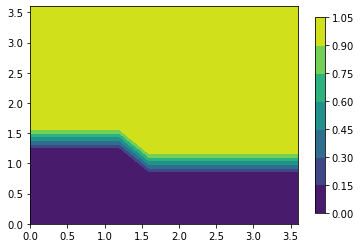

In [27]:
h = 0.4
xx, yy = np.meshgrid(np.arange(0, 4, h),
                         np.arange(0, 4, h))

Xmesh = np.c_[xx.ravel(), yy.ravel()]
Z = np.array([1 if i > len(Xmesh)//3 else 0 for i in range(len(Xmesh))])
Z = Z.reshape(xx.shape)
print(Z)
fig = plt.figure()
fig = plt.contourf(xx, yy, Z)
plt.colorbar(fig, shrink=0.9)
plt.show()

In [28]:
def get_scores(X, y):
    # visualize decision boundary
    h = 0.4
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Xmesh = np.c_[xx.ravel(), yy.ravel()]
    inputs = [list(map(Value, xrow)) for xrow in Xmesh]
    scores = list(map(model, inputs))
    
    Z = np.array([s.data for s in scores])
    Z = Z.reshape(xx.shape)
    return xx, yy, Z

In [29]:
def visualize(X, y):
    # visualize decision boundary
    h = 0.4
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Xmesh = np.c_[xx.ravel(), yy.ravel()]
    inputs = [list(map(Value, xrow)) for xrow in Xmesh]
    scores = list(map(model, inputs))
    
    Z = np.array([s.data for s in scores])
    Z = Z.reshape(xx.shape)
    
    Z_discrete = np.array([s.data > 0 for s in scores])
    Z_discrete = Z_discrete.reshape(xx.shape)
    
    

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(40, 16), gridspec_kw={'width_ratios': [1, 1]})
    fig.subplots_adjust(wspace=0)
    
    
    
    cf1 = ax1.contourf(xx, yy, Z_discrete, cmap=plt.cm.Spectral, alpha=1)
    cf2 = ax2.contourf(xx, yy, Z, cmap=plt.cm.Spectral, alpha=1)
    
    fig.colorbar(cf1, ax=ax1)
    fig.colorbar(cf2, ax=ax2)
    
    ax1.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.Spectral)
    ax2.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.Spectral)
    
    #ax1.xlim(xx.min(), xx.max())
    #ax1.ylim(yy.min(), yy.max())
    
    ax1.set_title("Categorization for grid of points w/step: {}".format(h))
    ax2.set_title("Outpus scores for grid of points w/step: {}".format(h))
    
    plt.show()
    
    # fig = plt.figure(figsize=(20, 10))
    # ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    # fig = ax.plot_surface(xx, yy, Z, cmap=cm.coolwarm, alpha=0.5)
    # ax.scatter3D(X[:, 0], X[:, 1], c=y, alpha=1)
    # plt.colorbar(fig, shrink=0.8)

    fig = go.Figure(data=[go.Surface(x=xx, y=yy, z=Z)])

    fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=[0]*len(y), mode='markers',
                                   marker=dict(size=5, color=y)))

    fig.update_layout(title='Grid mapped throw network', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

    fig.show()


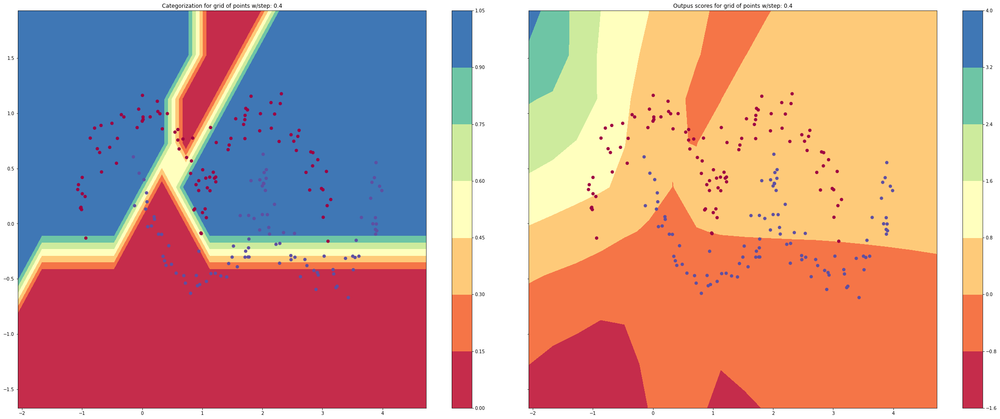

In [30]:
visualize(X, y)

In [31]:
from tqdm import tqdm

  0%|          | 0/500 [00:00<?, ?it/s]

step 0 loss 0.31414039202235444, accuracy 87.0%


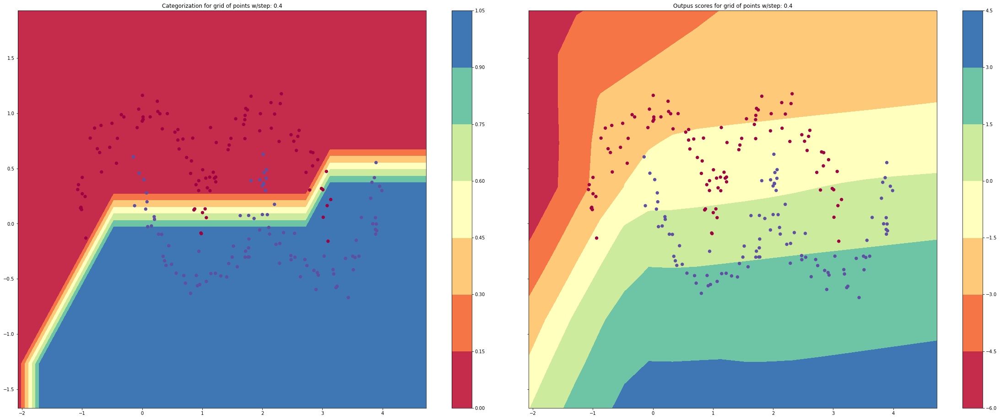

  2%|▏         | 10/500 [00:33<25:23,  3.11s/it]

step 10 loss 0.3146688598367168, accuracy 87.0%


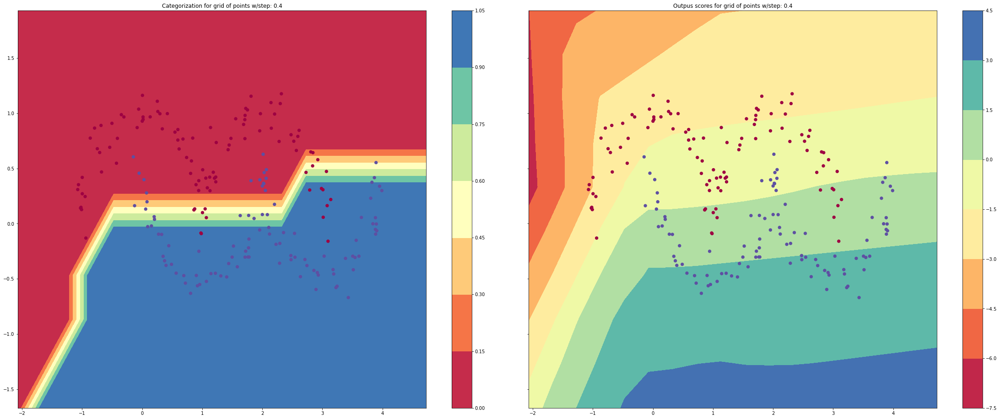

  4%|▍         | 20/500 [01:08<26:09,  3.27s/it]

step 20 loss 0.3115720404357997, accuracy 87.0%


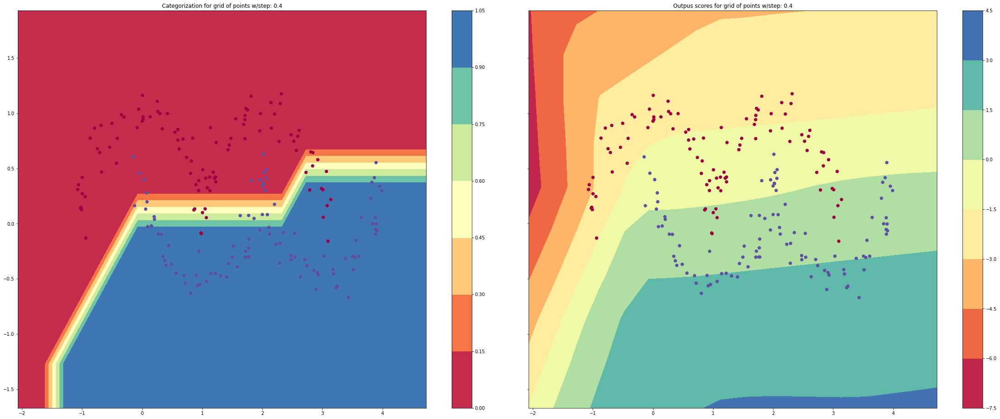

  6%|▌         | 30/500 [01:43<25:45,  3.29s/it]

step 30 loss 0.3307364022675145, accuracy 87.0%


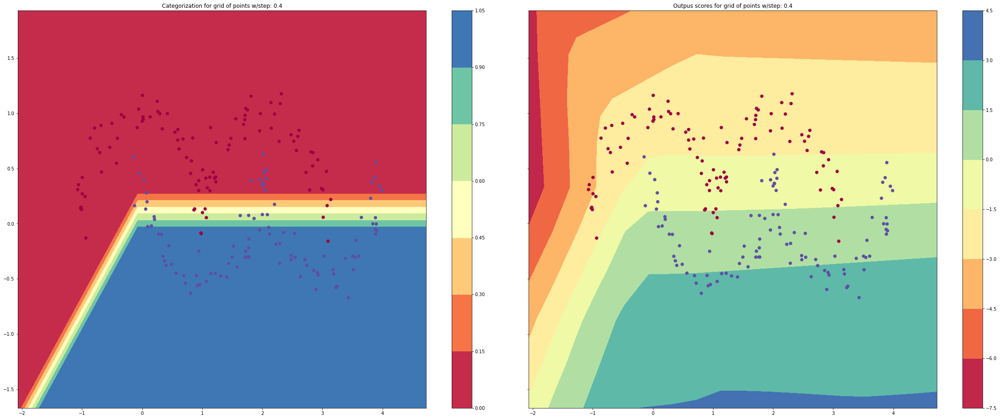

  8%|▊         | 40/500 [02:18<25:08,  3.28s/it]

step 40 loss 0.3221016469130244, accuracy 87.0%


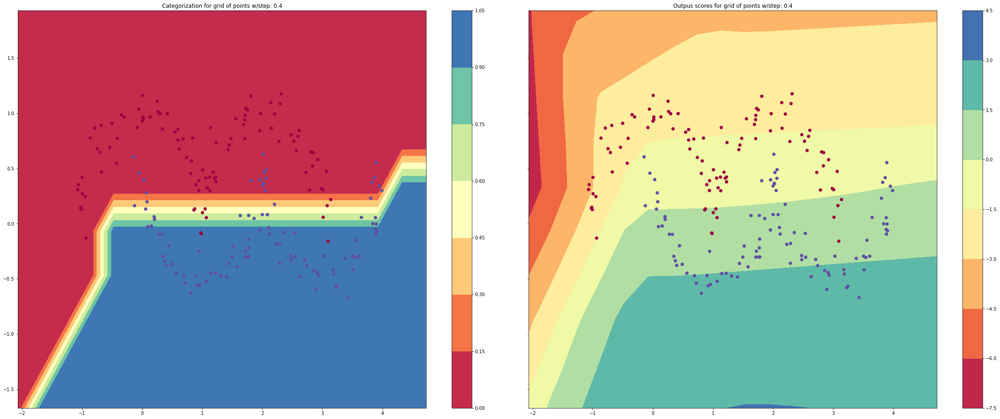

 10%|█         | 50/500 [02:54<24:43,  3.30s/it]

step 50 loss 0.31598401111294155, accuracy 87.0%


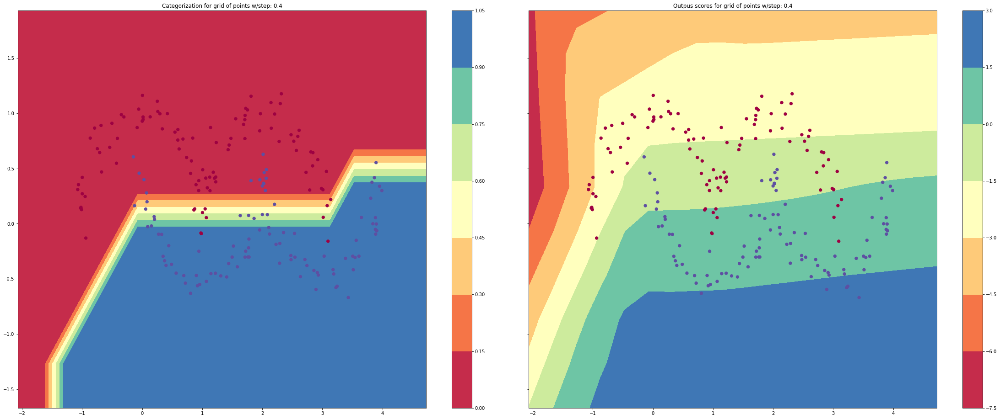

 12%|█▏        | 60/500 [03:29<24:02,  3.28s/it]

step 60 loss 0.3244666835095588, accuracy 86.5%


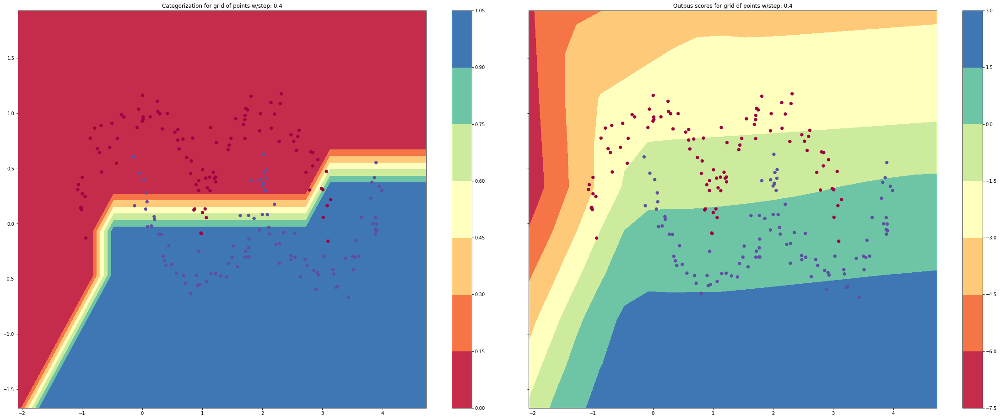

 14%|█▍        | 70/500 [04:04<23:49,  3.33s/it]

step 70 loss 0.3205075208087893, accuracy 86.5%


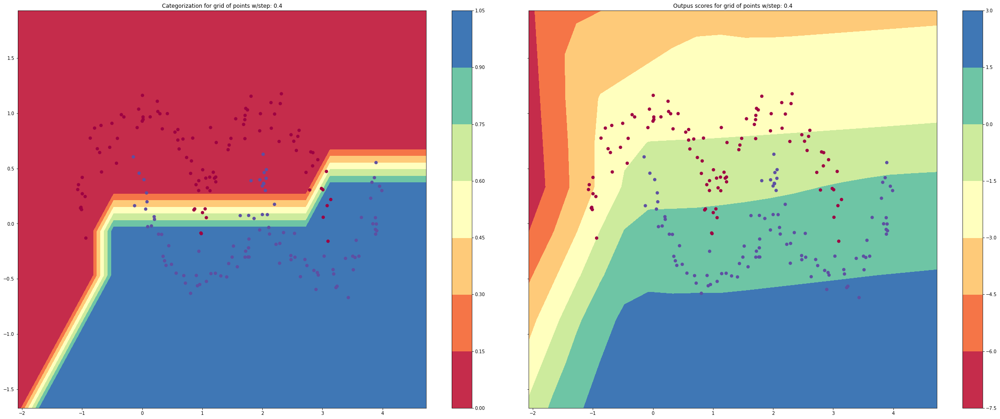

 16%|█▌        | 80/500 [04:39<23:26,  3.35s/it]

step 80 loss 0.3538922745454465, accuracy 86.0%


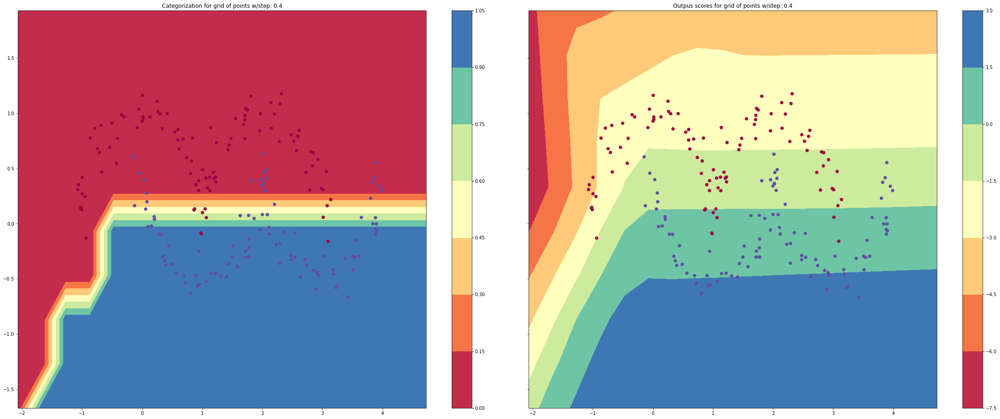

 18%|█▊        | 90/500 [05:17<23:58,  3.51s/it]

step 90 loss 0.3281087370153447, accuracy 85.0%


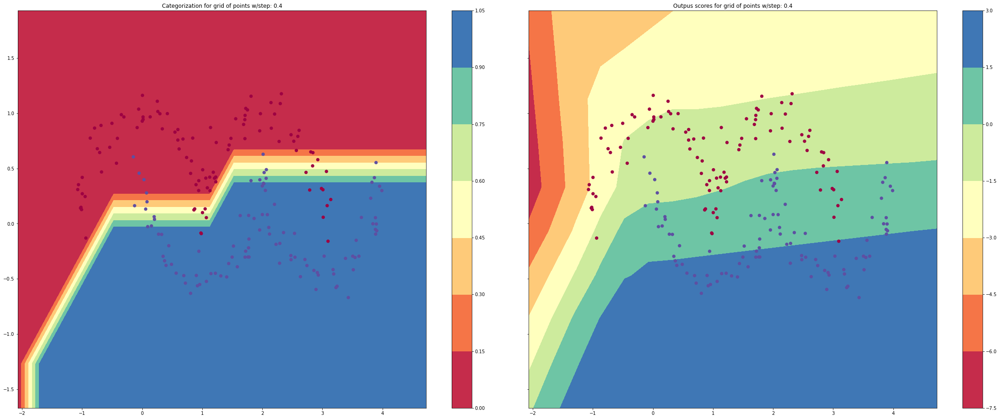

 20%|██        | 100/500 [05:52<21:46,  3.27s/it]

step 100 loss 0.31612514578769785, accuracy 85.0%


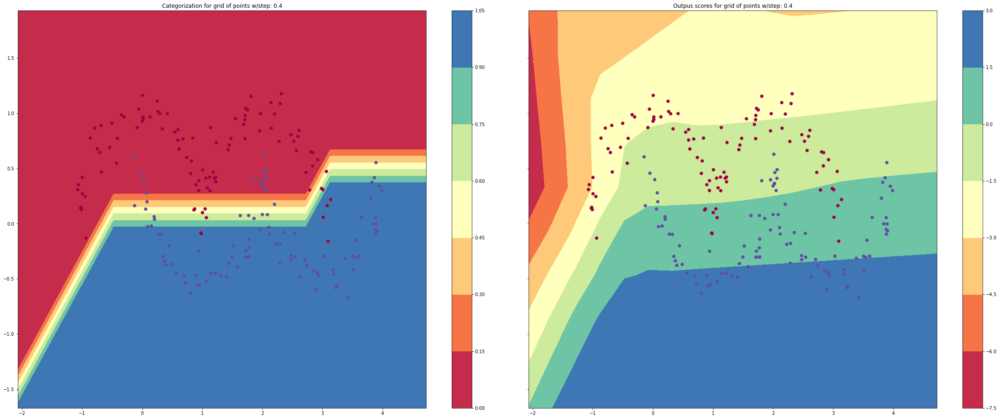

 22%|██▏       | 110/500 [06:29<22:40,  3.49s/it]

step 110 loss 0.31685956425505113, accuracy 84.5%


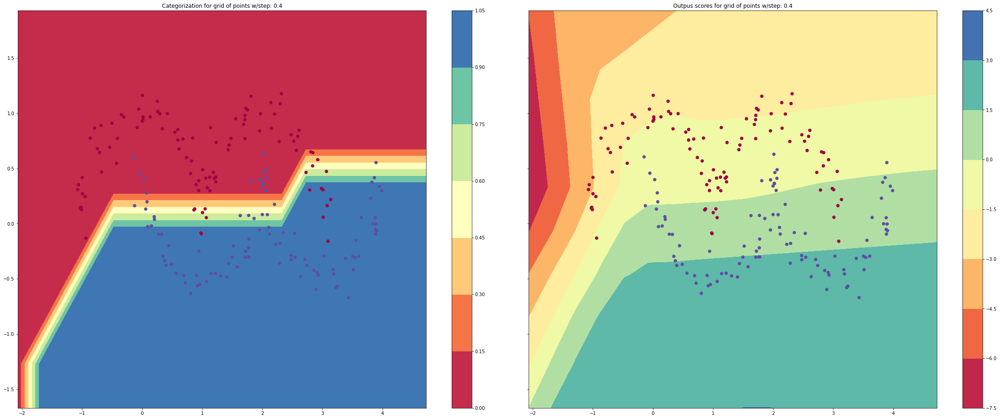

 24%|██▍       | 120/500 [07:03<20:12,  3.19s/it]

step 120 loss 0.29511490840791493, accuracy 87.0%


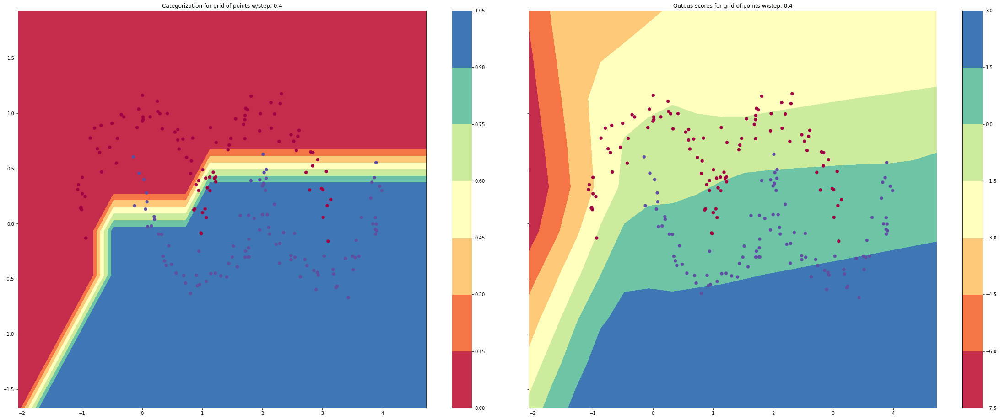

 26%|██▌       | 130/500 [07:37<19:53,  3.22s/it]

step 130 loss 0.3010709743335865, accuracy 86.5%


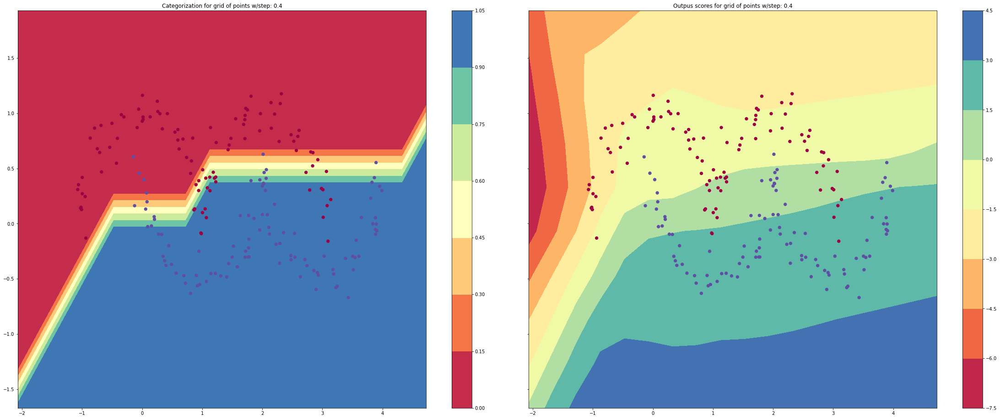

 28%|██▊       | 140/500 [08:11<19:19,  3.22s/it]

step 140 loss 0.29756557745401235, accuracy 86.5%


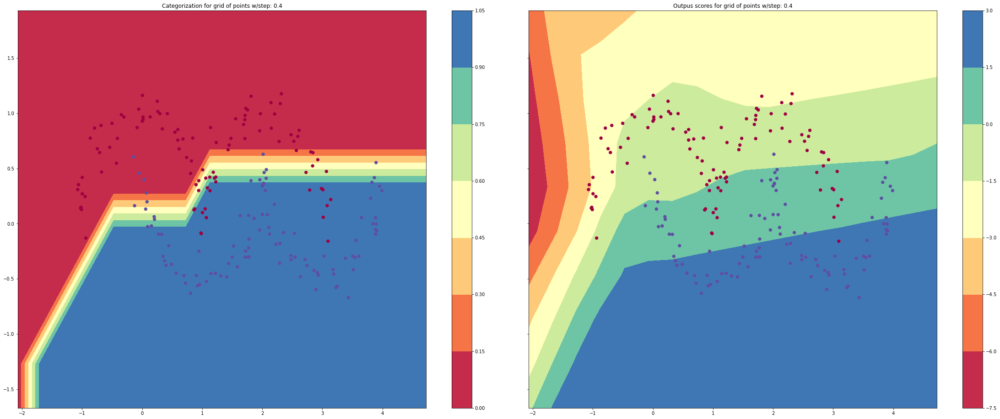

 30%|███       | 150/500 [08:46<18:36,  3.19s/it]

step 150 loss 0.292447679023908, accuracy 87.5%


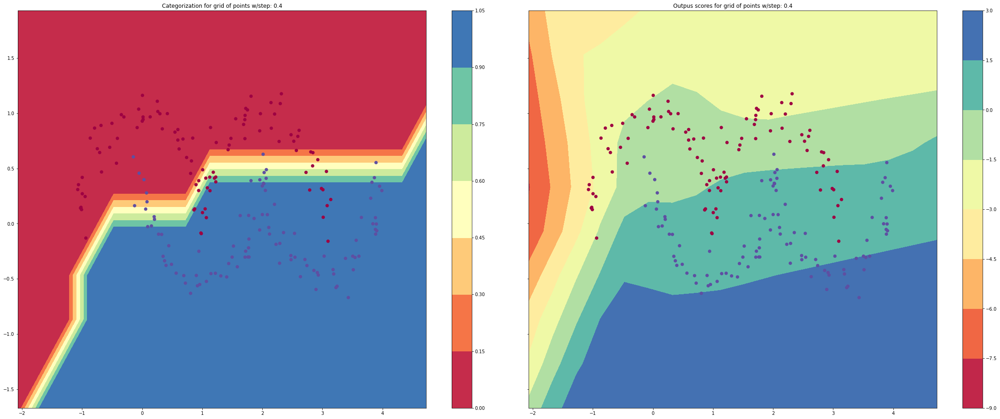

 32%|███▏      | 160/500 [09:20<18:12,  3.21s/it]

step 160 loss 0.29243089076277023, accuracy 86.5%


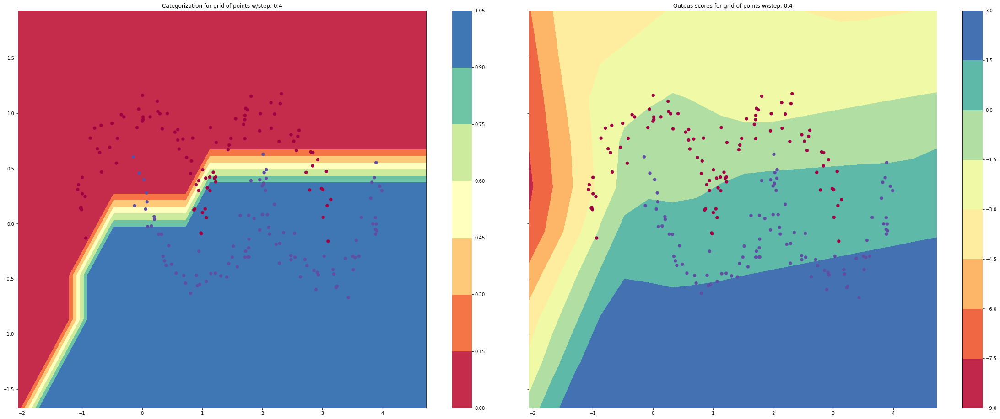

 34%|███▍      | 170/500 [09:54<17:51,  3.25s/it]

step 170 loss 0.31230361316695276, accuracy 85.5%


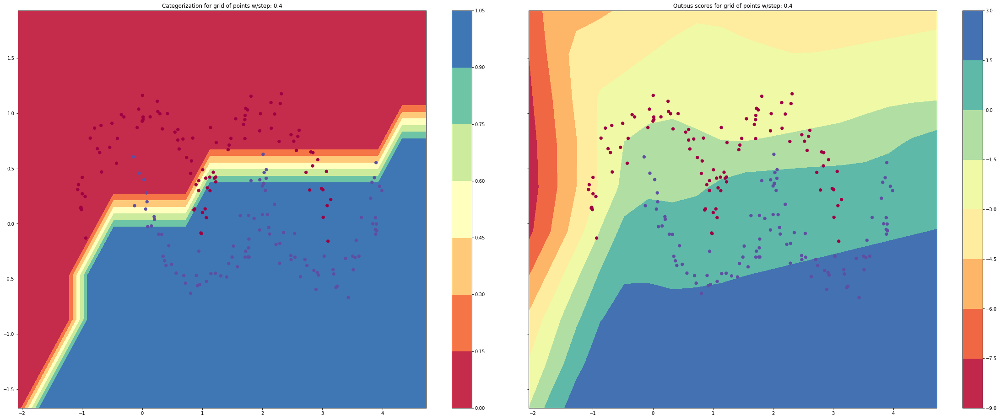

 36%|███▌      | 180/500 [10:28<17:05,  3.21s/it]

step 180 loss 0.2958442847108673, accuracy 86.5%


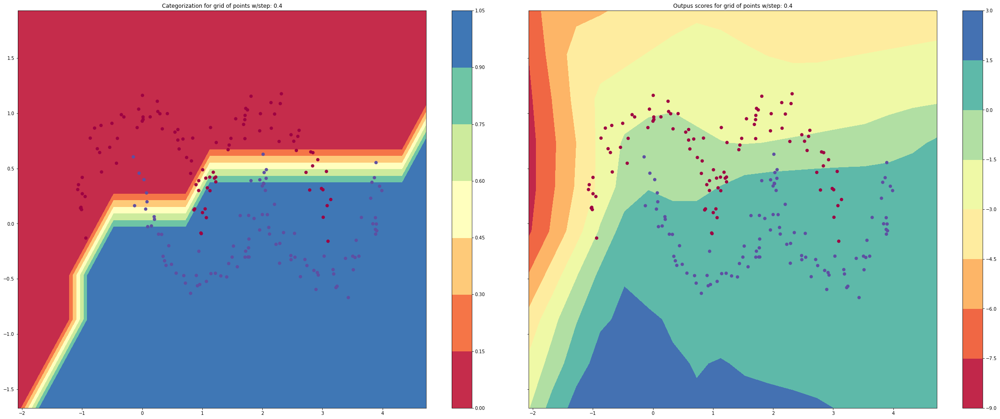

 38%|███▊      | 190/500 [11:02<16:32,  3.20s/it]

step 190 loss 0.2793257575917202, accuracy 87.5%


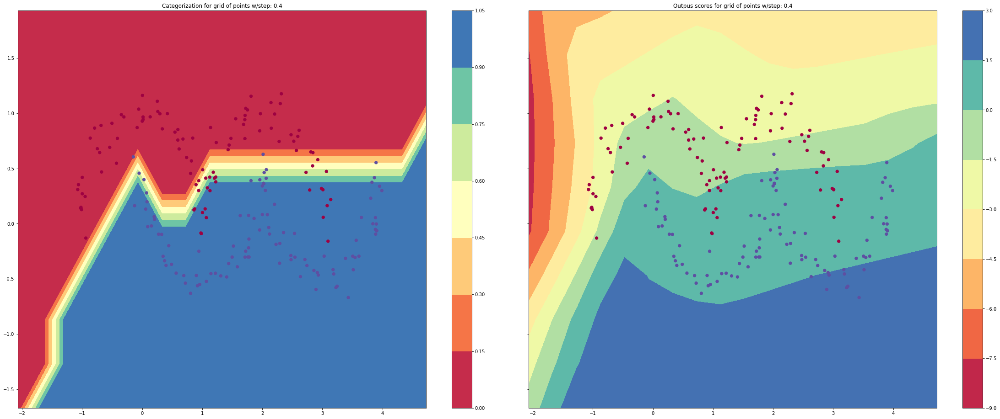

 40%|████      | 200/500 [11:36<16:03,  3.21s/it]

step 200 loss 0.2607305118122053, accuracy 88.5%


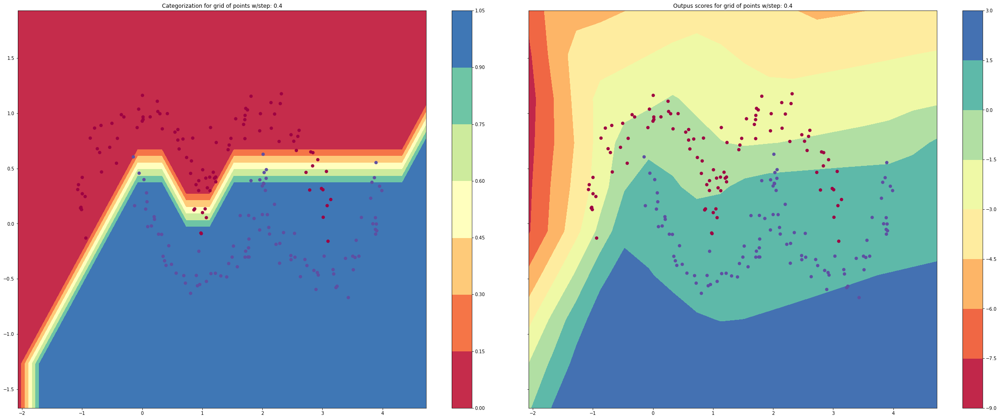

 42%|████▏     | 210/500 [12:11<15:49,  3.28s/it]

step 210 loss 0.2707105774079484, accuracy 87.5%


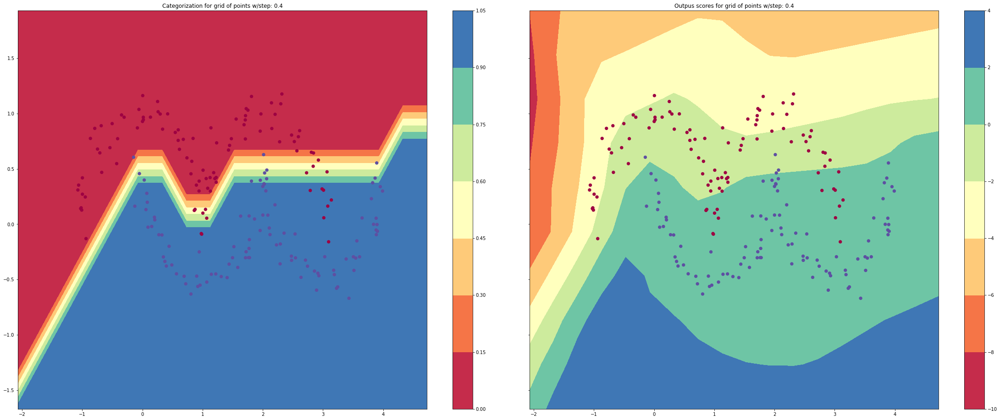

 44%|████▍     | 220/500 [12:45<14:37,  3.13s/it]

step 220 loss 0.2546598255218247, accuracy 88.5%


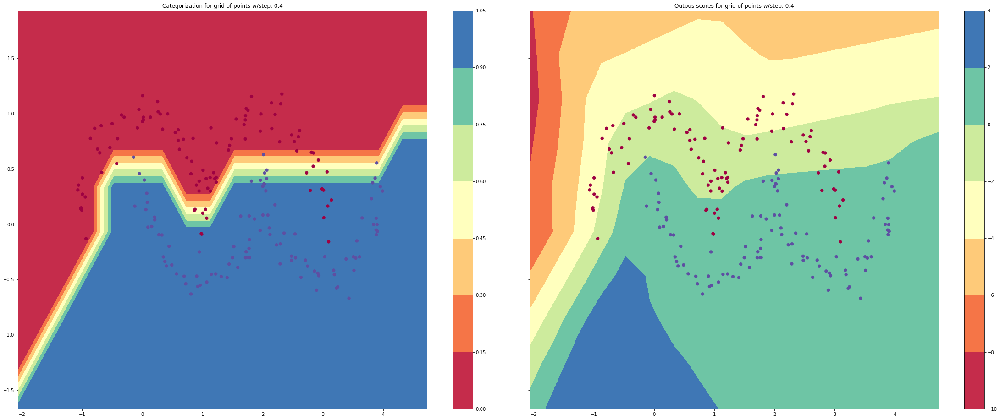

 46%|████▌     | 230/500 [13:18<14:05,  3.13s/it]

step 230 loss 0.25203858177848365, accuracy 89.5%


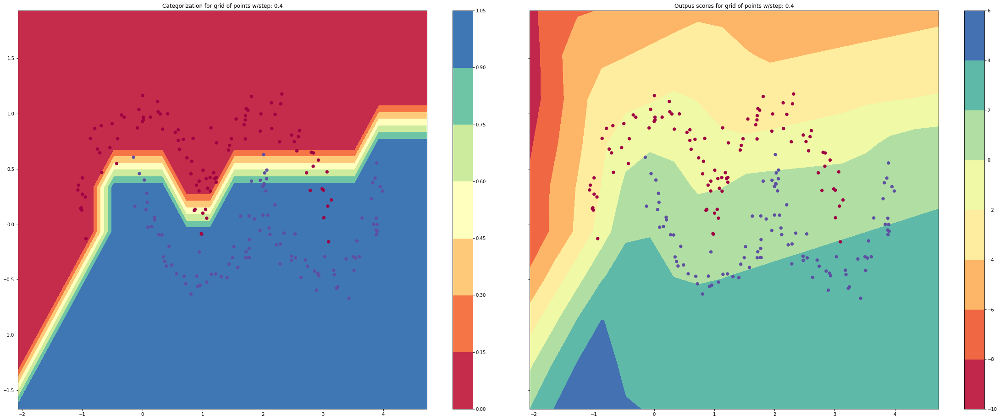

 48%|████▊     | 240/500 [13:51<13:28,  3.11s/it]

step 240 loss 0.24022018470988984, accuracy 89.0%


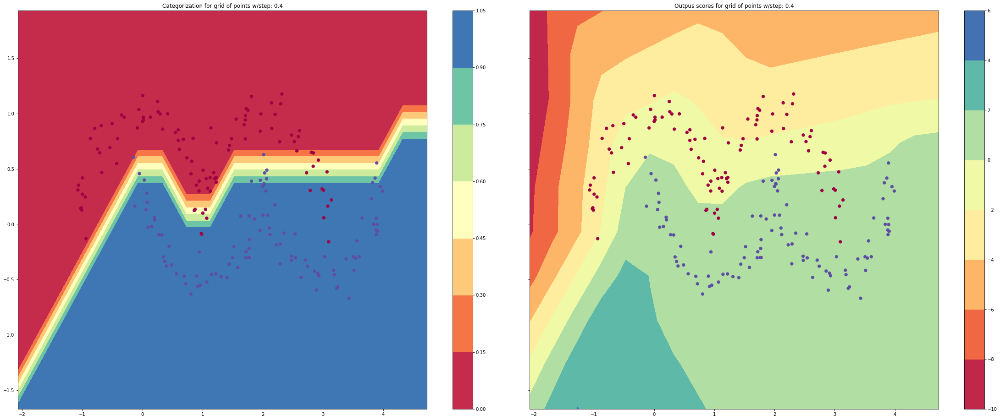

 50%|█████     | 250/500 [14:25<13:03,  3.13s/it]

step 250 loss 0.2353407274700583, accuracy 89.5%


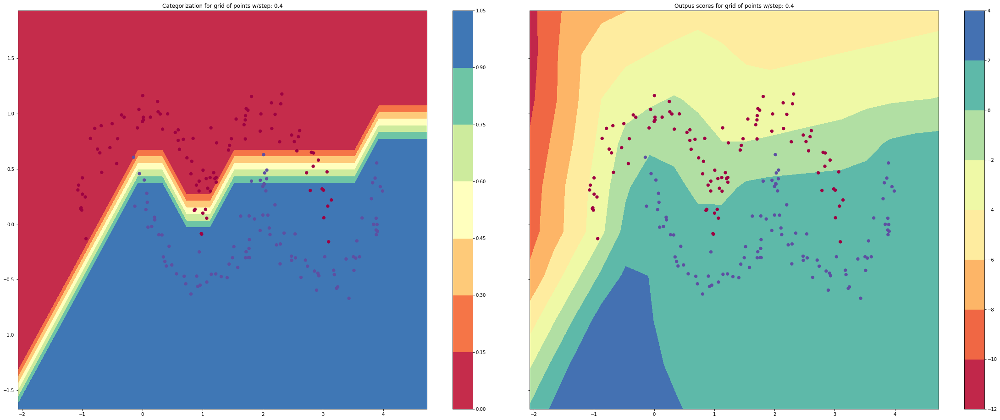

 52%|█████▏    | 260/500 [14:58<12:21,  3.09s/it]

step 260 loss 0.24451713188688215, accuracy 89.5%


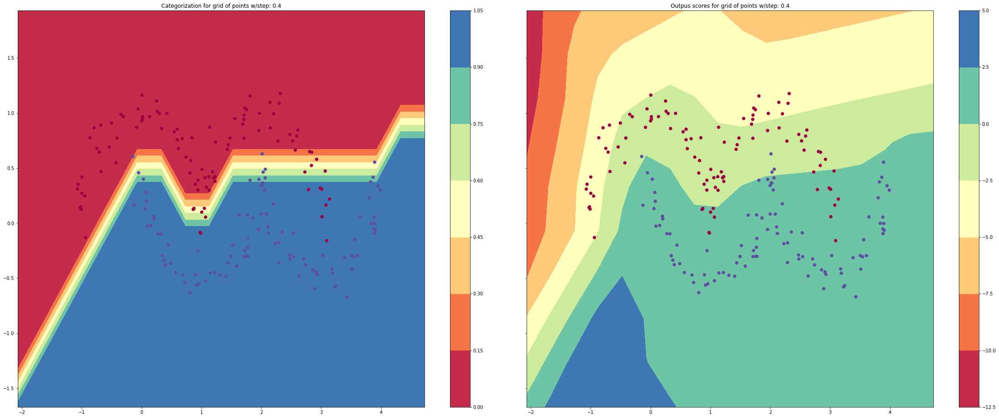

 54%|█████▍    | 270/500 [15:32<12:03,  3.14s/it]

step 270 loss 0.2376997869861186, accuracy 88.0%


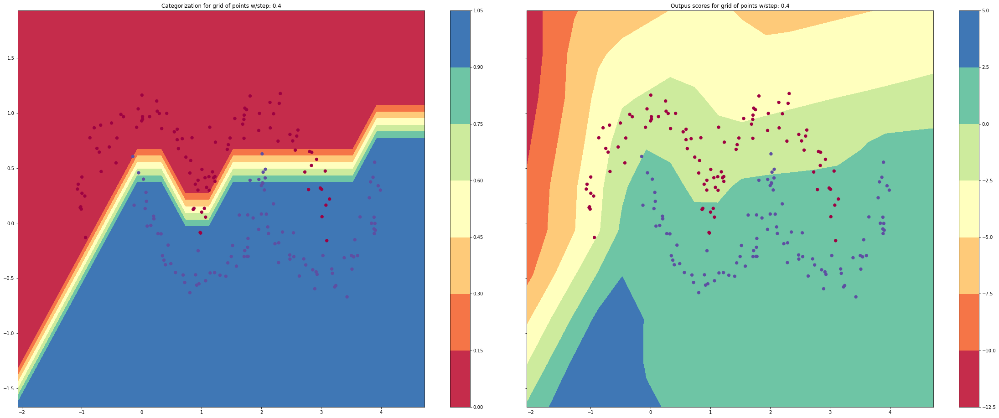

 56%|█████▌    | 280/500 [16:05<11:25,  3.12s/it]

step 280 loss 0.23201566281884173, accuracy 89.5%


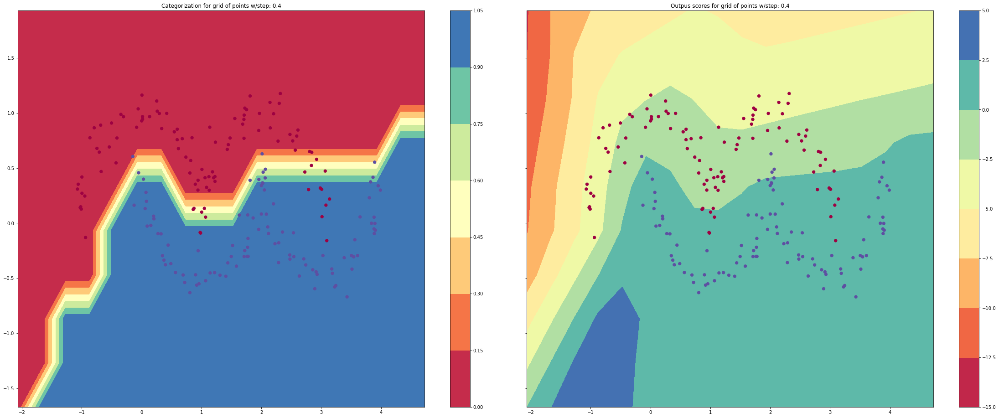

 58%|█████▊    | 290/500 [16:38<10:55,  3.12s/it]

step 290 loss 0.2345264814508559, accuracy 89.5%


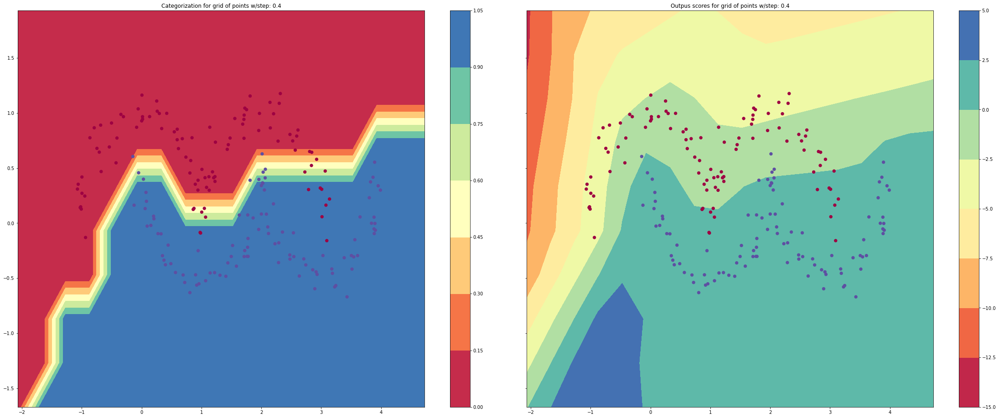

 60%|██████    | 300/500 [17:12<10:38,  3.19s/it]

step 300 loss 0.23105622138584755, accuracy 89.5%


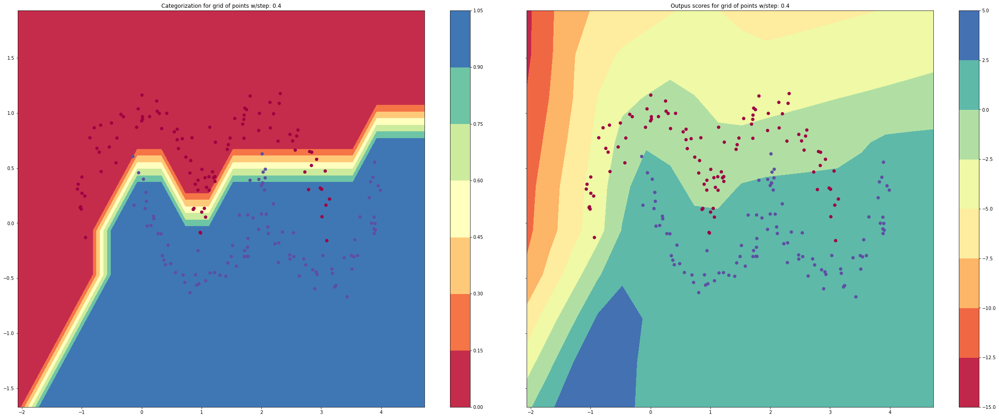

 62%|██████▏   | 310/500 [17:46<09:58,  3.15s/it]

step 310 loss 0.2414393063372921, accuracy 90.0%


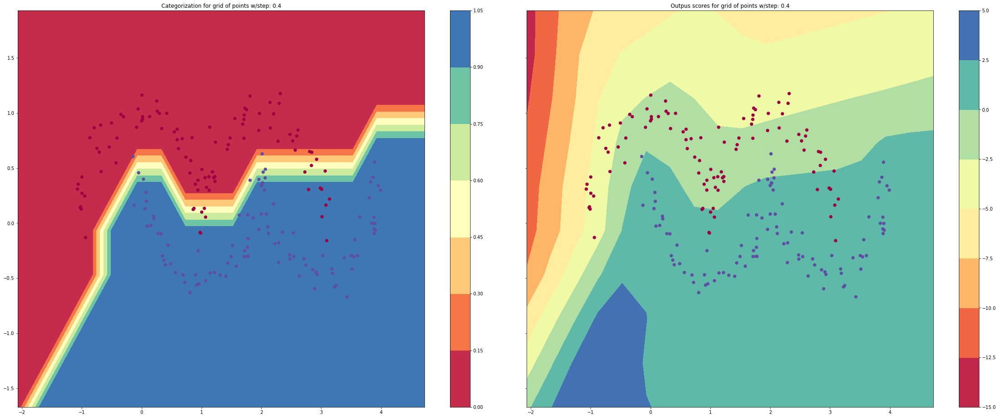

 64%|██████▍   | 320/500 [18:19<09:23,  3.13s/it]

step 320 loss 0.2325837411171083, accuracy 89.5%


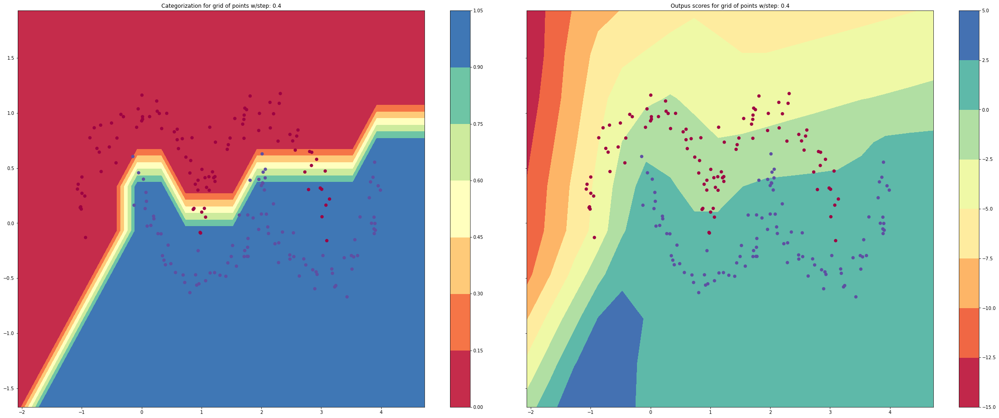

 66%|██████▌   | 330/500 [18:53<09:03,  3.20s/it]

step 330 loss 0.23206617570359014, accuracy 90.0%


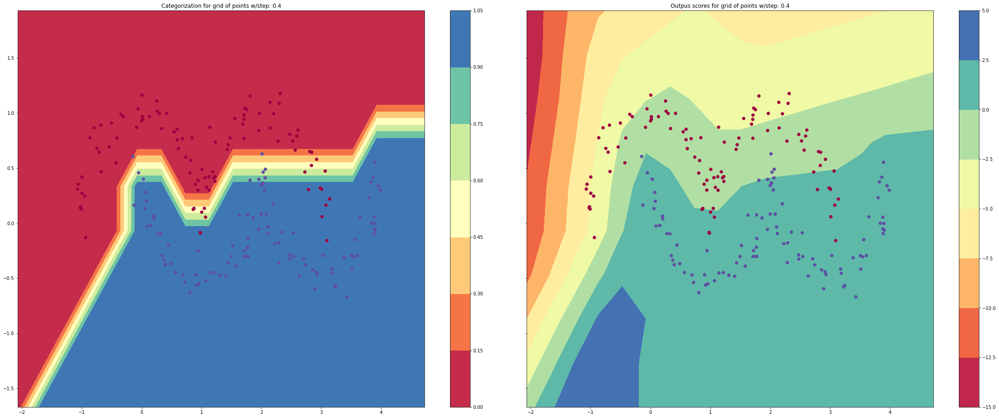

 68%|██████▊   | 340/500 [19:27<08:29,  3.19s/it]

step 340 loss 0.2276818879049035, accuracy 89.5%


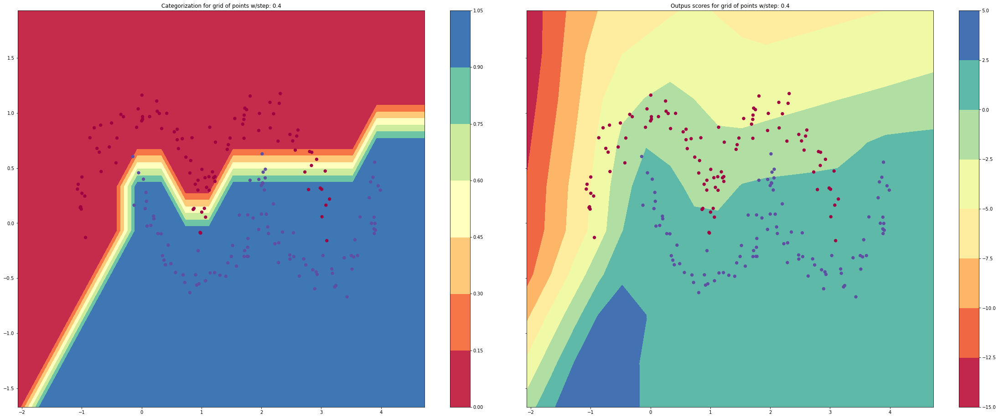

 70%|███████   | 350/500 [20:00<07:48,  3.12s/it]

step 350 loss 0.2264566505266155, accuracy 89.5%


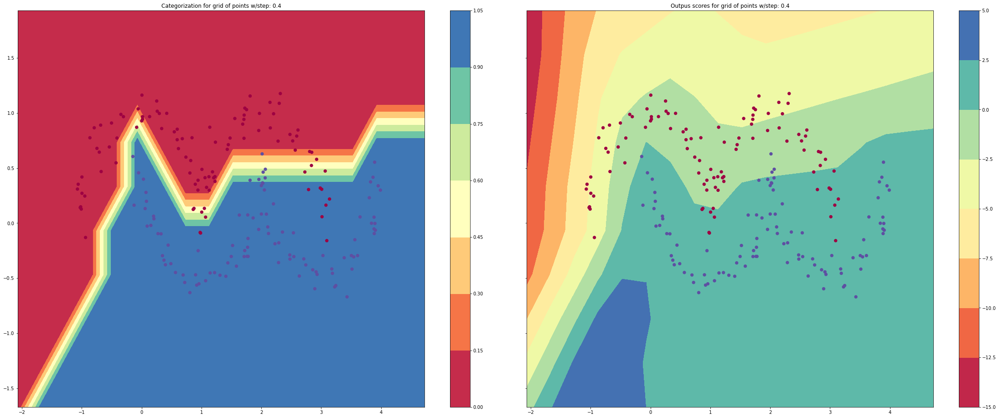

 72%|███████▏  | 360/500 [20:33<07:17,  3.13s/it]

step 360 loss 0.22779689490521024, accuracy 89.0%


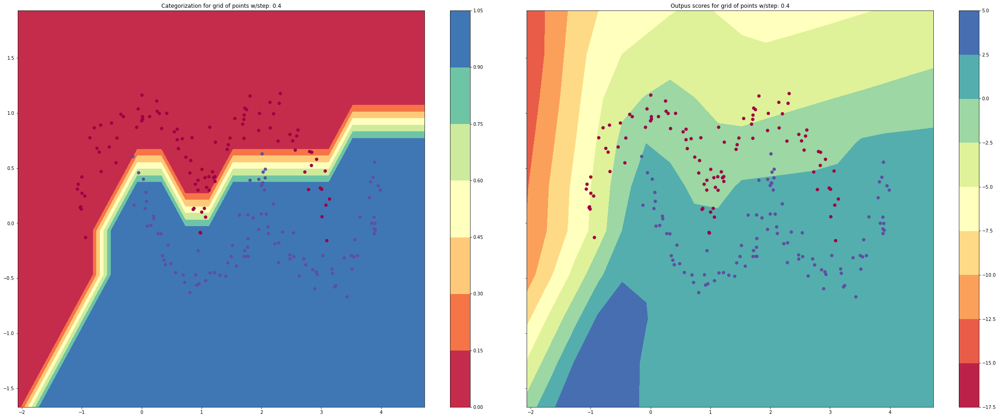

 74%|███████▍  | 370/500 [21:07<06:46,  3.13s/it]

step 370 loss 0.22602582856315134, accuracy 89.5%


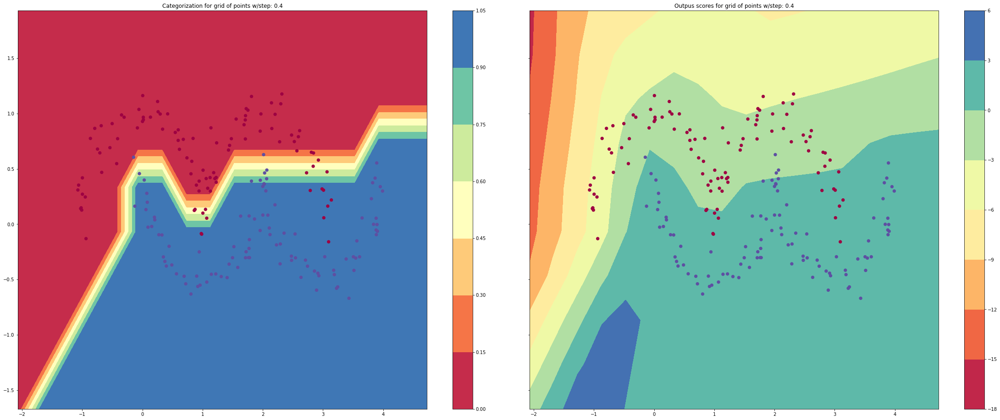

 76%|███████▌  | 380/500 [21:40<06:14,  3.12s/it]

step 380 loss 0.22597362069050417, accuracy 89.5%


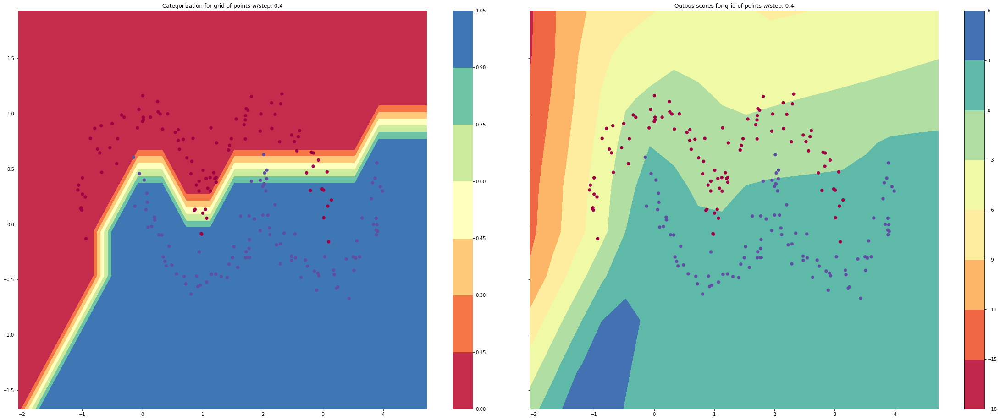

 78%|███████▊  | 390/500 [22:14<05:44,  3.13s/it]

step 390 loss 0.22664563775651164, accuracy 89.5%


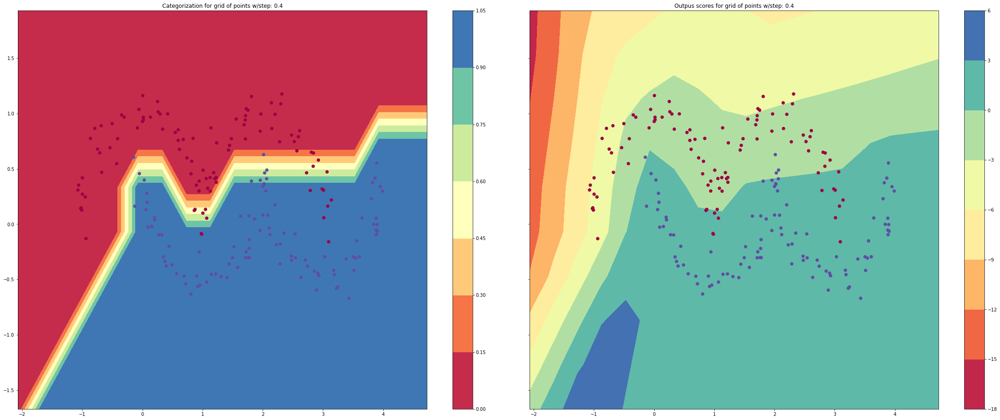

 80%|████████  | 400/500 [22:45<04:56,  2.97s/it]

step 400 loss 0.2260230469099777, accuracy 89.5%


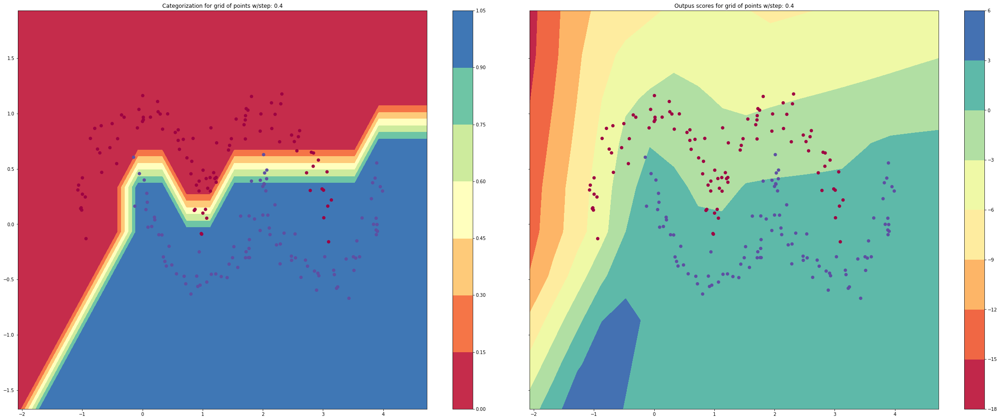

 82%|████████▏ | 410/500 [23:17<04:24,  2.94s/it]

step 410 loss 0.22601852324323485, accuracy 89.5%


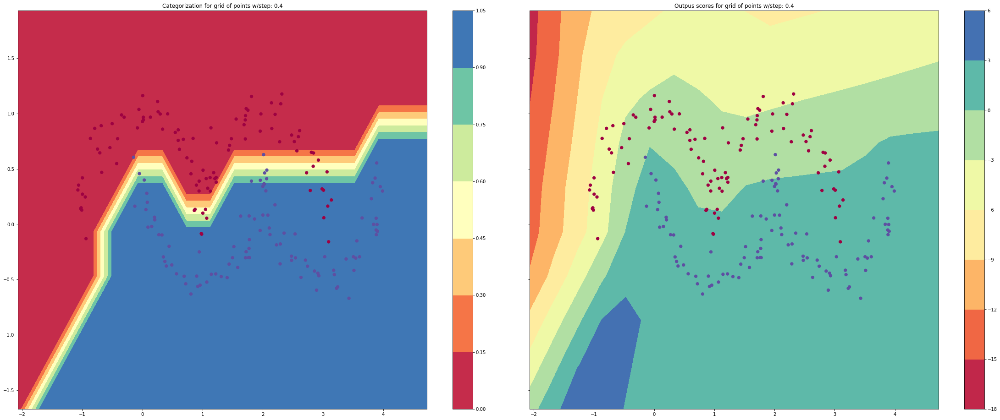

 84%|████████▍ | 420/500 [23:49<03:59,  2.99s/it]

step 420 loss 0.22618265726097064, accuracy 89.5%


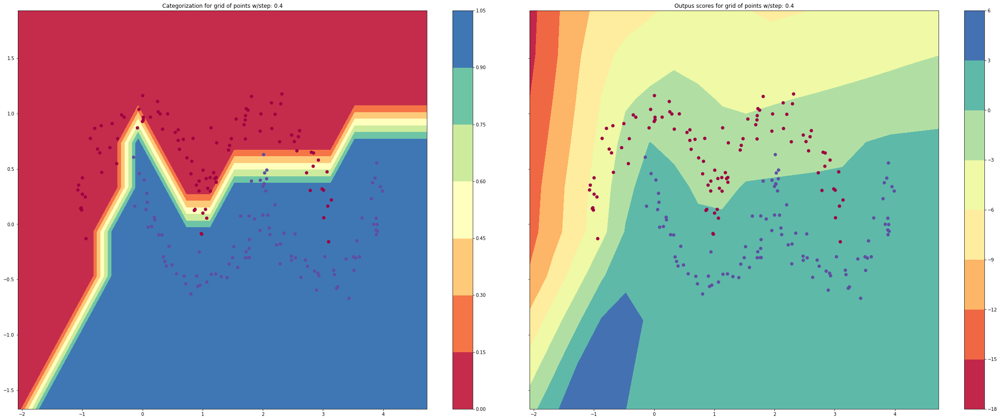

 86%|████████▌ | 430/500 [24:21<03:31,  3.01s/it]

step 430 loss 0.2257512047290923, accuracy 89.5%


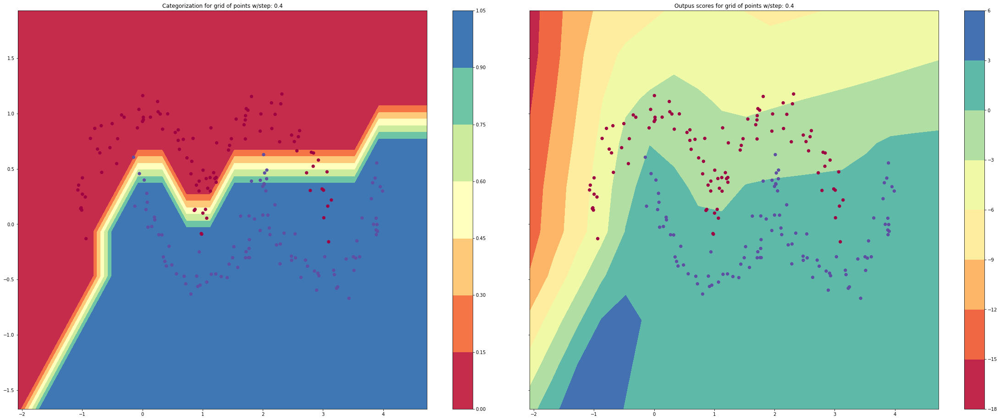

 88%|████████▊ | 440/500 [24:53<03:01,  3.03s/it]

step 440 loss 0.2245138767491747, accuracy 89.5%


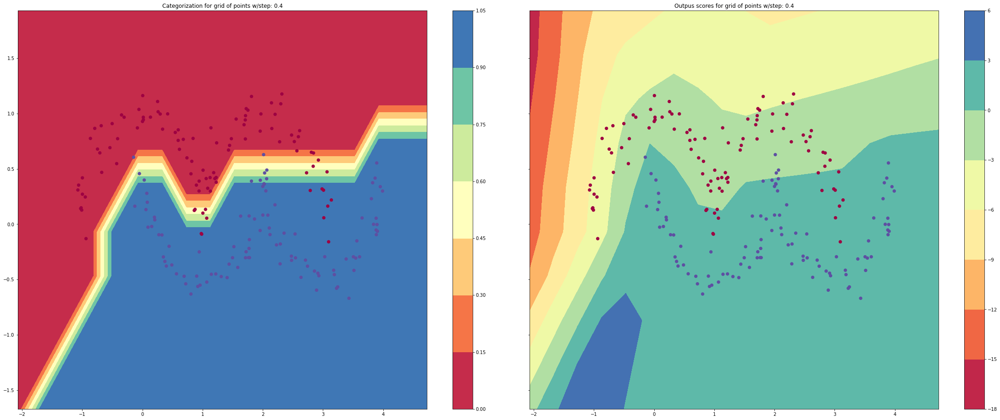

 90%|█████████ | 450/500 [25:24<02:29,  2.99s/it]

step 450 loss 0.22560539969992477, accuracy 89.5%


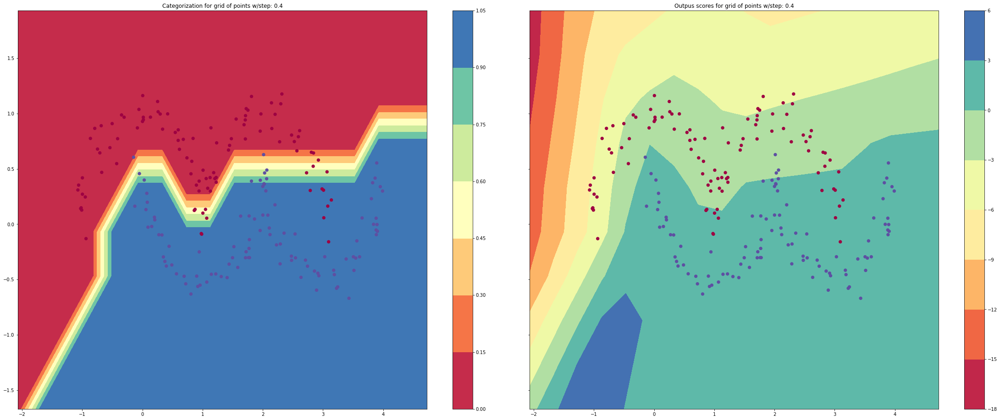

 92%|█████████▏| 460/500 [25:56<02:01,  3.03s/it]

step 460 loss 0.22475267265472312, accuracy 89.5%


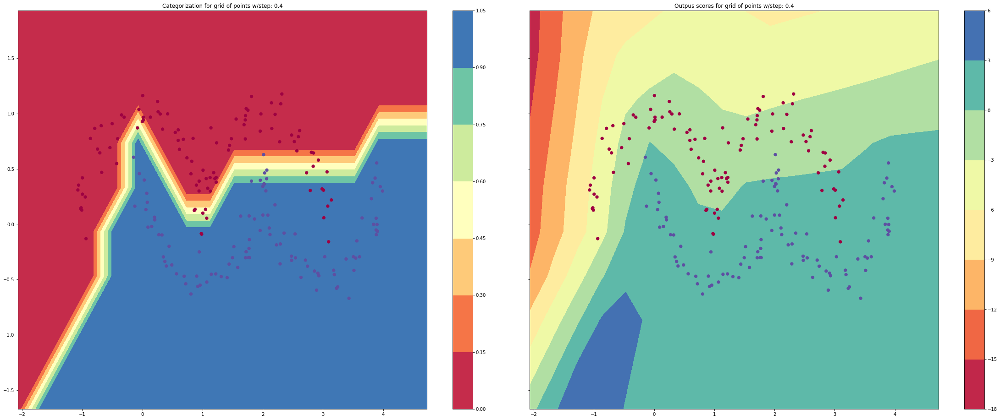

 94%|█████████▍| 470/500 [26:28<01:29,  3.00s/it]

step 470 loss 0.22387410830908386, accuracy 89.5%


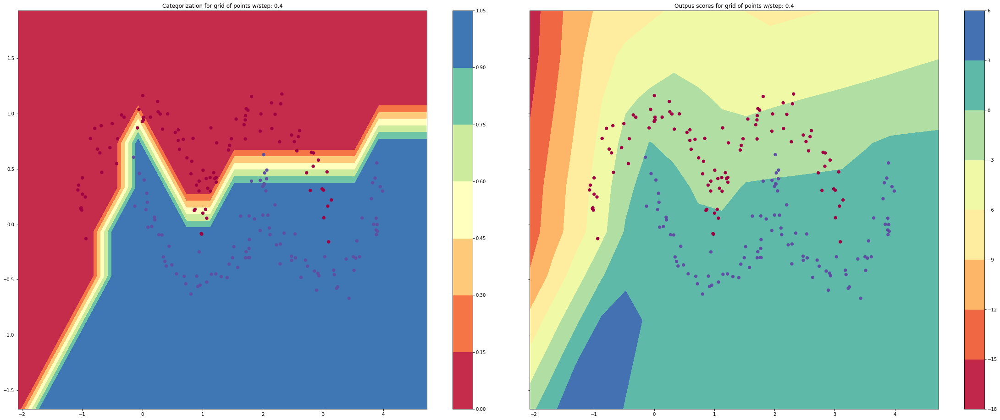

 96%|█████████▌| 480/500 [27:00<01:00,  3.00s/it]

step 480 loss 0.2238390403657131, accuracy 89.5%


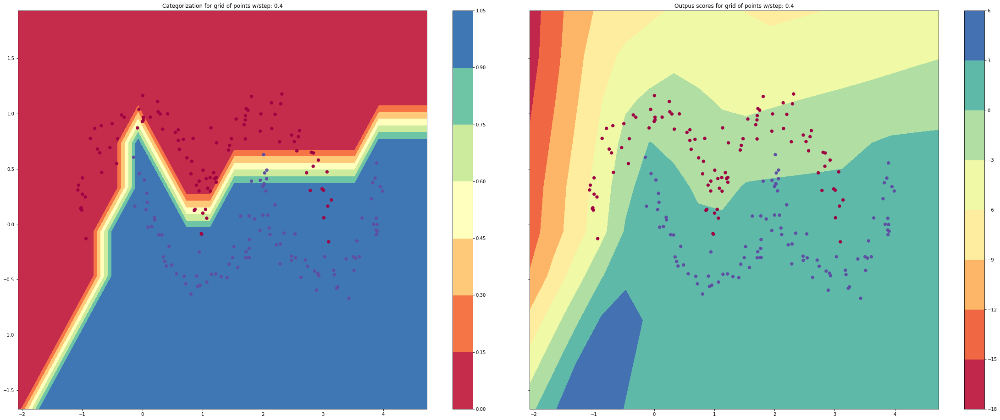

 98%|█████████▊| 490/500 [27:33<00:31,  3.16s/it]

step 490 loss 0.2236590245406163, accuracy 89.5%


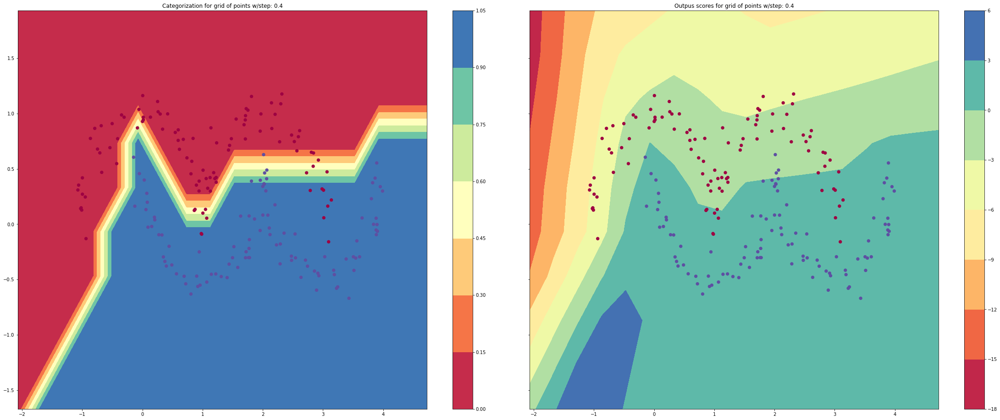

100%|██████████| 500/500 [28:07<00:00,  3.38s/it]


In [33]:
# optimization
stats = []
n_iter = 500
for k in tqdm(range(n_iter)):
    
    # forward
    total_loss, acc = loss()
    
    stats.append([total_loss.data, acc])
    
    # backward
    model.zero_grad()
    total_loss.backward()
    
    # update (sgd)
    learning_rate = 1.0 - 0.9*k/n_iter
    for p in model.parameters():
        p.data -= learning_rate * p.grad
    
    #xx, yy, Z = get_scores(X, y)
    
#     iter_scores = []
#     iter_scores.append(Z)
    
    if k % 10 == 0:
        print(f"step {k} loss {total_loss.data}, accuracy {acc*100}%")
        visualize(X, y)
        

In [34]:
iter_scores

NameError: name 'iter_scores' is not defined

In [ ]:
plt.plot(stats, label=["loss","accuracy"])
plt.legend()
plt.show()

In [ ]:
# visualize decision boundary

h = 0.25
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))
Xmesh = np.c_[xx.ravel(), yy.ravel()]
inputs = [list(map(Value, xrow)) for xrow in Xmesh]
scores = list(map(model, inputs))
Z = np.array([s.data > 0 for s in scores])
Z = Z.reshape(xx.shape)

fig = plt.figure()
plt.contourf(xx, yy, Z, cmap=plt.cm.Spectral, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.Spectral)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
